In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

from __future__ import division
from __future__ import print_function
from __future__ import absolute_import
from __future__ import unicode_literals  

import numpy as np
import pandas as pd
from sklearn import linear_model, preprocessing, cluster
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.linalg as slin
import scipy.sparse.linalg as sparselin
import scipy.sparse as sparse
import IPython

import tensorflow as tf

from inceptionModel import BinaryInceptionModel
from logisticRegressionWithLBFGS import LogisticRegressionWithLBFGS
from binaryLogisticRegressionWithLBFGS import BinaryLogisticRegressionWithLBFGS

from load_animals import load_animals

import experiments
from image_utils import plot_flat_bwimage, plot_flat_bwgrad, plot_flat_colorimage, plot_flat_colorgrad
 
from dataset import DataSet
from tensorflow.contrib.learn.python.learn.datasets import base

sns.set(color_codes=True)

Using TensorFlow backend.


In [3]:
def reverse_preprocess(x):
    x /= 2.
    x += 0.5
    return x

# Setup

In [4]:
num_classes = 2
num_train_ex_per_class = 900
num_test_ex_per_class = 300

model_name = 'dogfish_%s_%s' % (num_train_ex_per_class, num_test_ex_per_class)
image_data_sets = load_animals(
    num_train_ex_per_class=num_train_ex_per_class, 
    num_test_ex_per_class=num_test_ex_per_class,
    classes=['dog', 'fish'])

Loading animals from disk...


In [51]:
model_name = 'dogfish_900_300'

train_f = np.load('/srv/scratch/pangwei/influence_data/%s_inception_features_train.npz' % model_name)
train = DataSet(train_f['inception_features_val'], train_f['labels'])
test_f = np.load('/srv/scratch/pangwei/influence_data/%s_inception_features_test.npz' % model_name)
test = DataSet(test_f['inception_features_val'], test_f['labels'])
validation = None

data_sets = base.Datasets(train=train, validation=validation, test=test)

input_dim = 2048
weight_decay = 0.001
batch_size = 900
initial_learning_rate = 0.001 
keep_probs = None
decay_epochs = [1000, 10000]
max_lbfgs_iter = 1000
num_classes = 2

tf.reset_default_graph()

model = BinaryLogisticRegressionWithLBFGS(
    input_dim=input_dim,
    weight_decay=weight_decay,
    max_lbfgs_iter=max_lbfgs_iter,
    num_classes=num_classes, 
    batch_size=batch_size,
    data_sets=data_sets,
    initial_learning_rate=initial_learning_rate,
    keep_probs=keep_probs,
    decay_epochs=decay_epochs,
    mini_batch=False,
    train_dir='data',
    log_dir='log',
    model_name='%s_inception_onlytop' % model_name)

model.train()
weights = model.sess.run(model.weights)
np.save('data/inception_weights_%s' % model_name, weights)

Total number of parameters: 2048
Using normal model
LBFGS training took [49] iter.
After training with LBFGS: 
Train loss (w reg) on all data: 0.00480081
Test loss (w/o reg) on all data: 0.0276413
Train acc on all data:  1.0
Test acc on all data:   0.986666666667
Norm of the mean of gradients: 3.47416e-07
Norm of the params: 2.56925


# Look for good test_idx

In [19]:
assert np.all(model.data_sets.test.labels == image_data_sets.test.labels)
assert np.all(model.data_sets.train.labels == image_data_sets.train.labels)

In [53]:
Y_pred = model.sess.run(model.preds, feed_dict=model.all_test_feed_dict)
Y_test = model.data_sets.test.labels

2 [ 0.09281988  0.90718019]


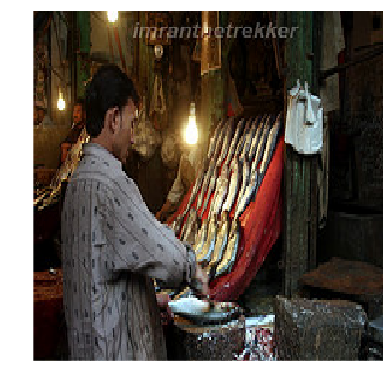

5 [ 0.00307147  0.99692851]


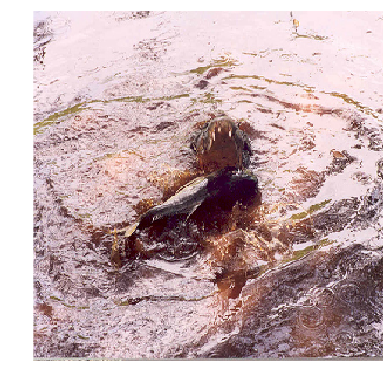

20 [ 0.56195503  0.43804497]


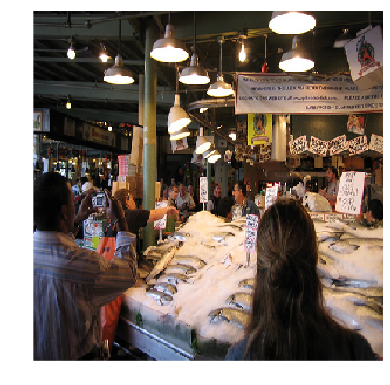

35 [ 0.00495586  0.99504411]


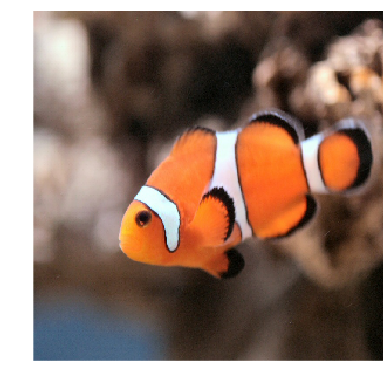

36 [ 0.00314831  0.99685174]


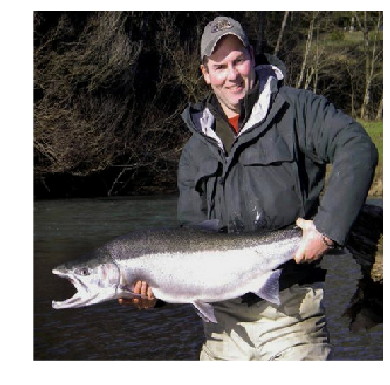

37 [ 0.00439228  0.99560767]


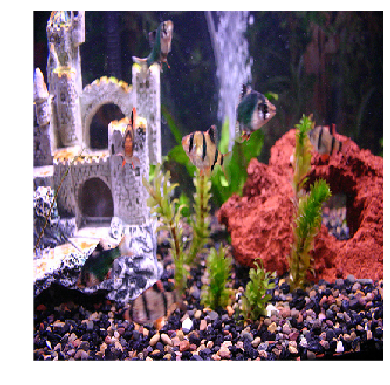

42 [ 0.06246782  0.93753225]


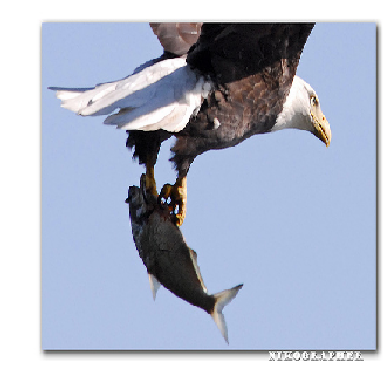

69 [ 0.00305458  0.99694544]


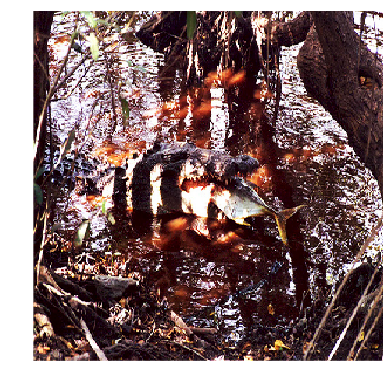

84 [ 0.00403473  0.99596524]


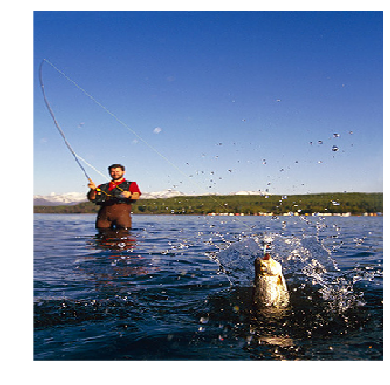

101 [ 0.00272395  0.99727601]


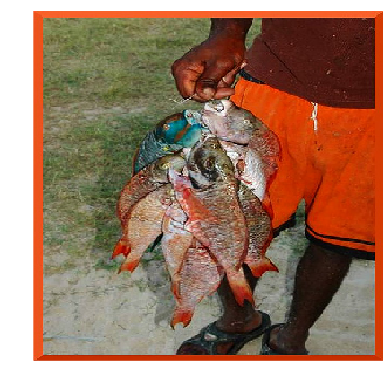

109 [ 0.10776391  0.89223605]


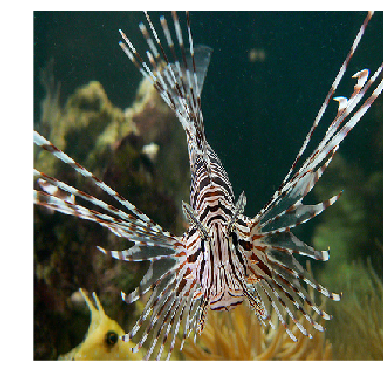

140 [ 0.00509753  0.99490249]


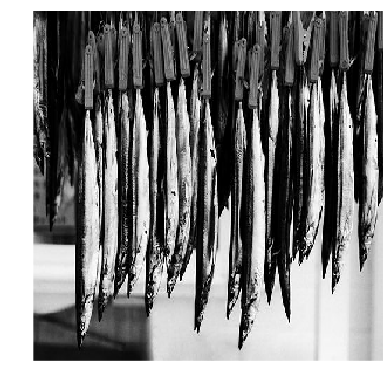

144 [ 0.00260831  0.9973917 ]


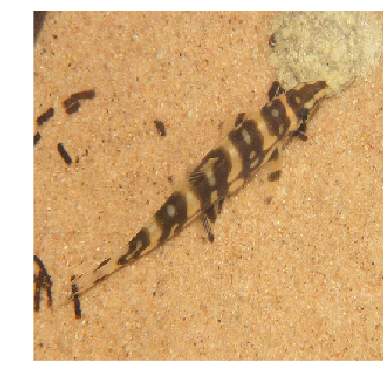

161 [ 0.00257219  0.99742776]


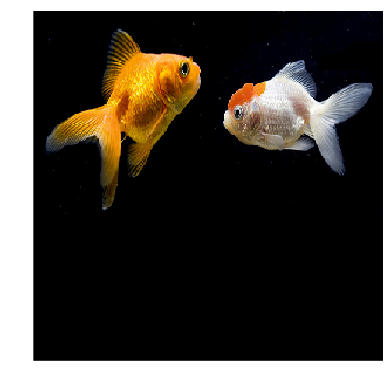

168 [ 0.0052845   0.99471551]


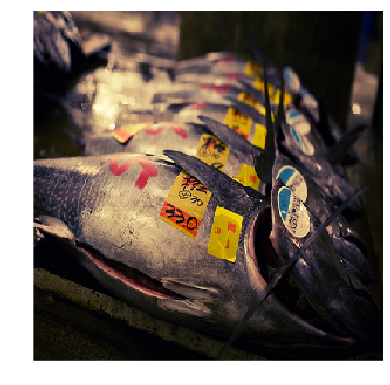

178 [ 0.00840088  0.99159908]


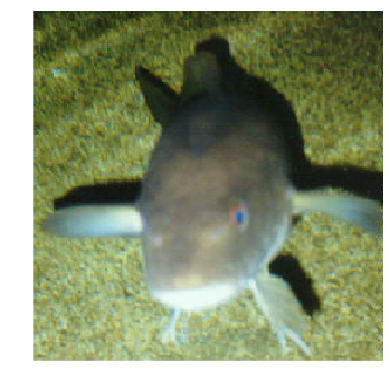

180 [ 0.00140145  0.99859852]


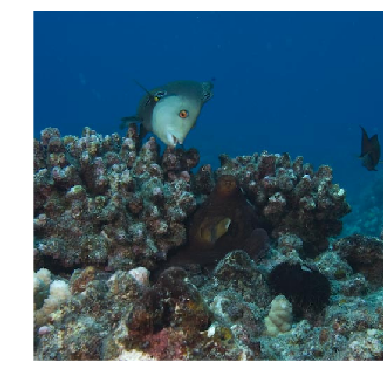

222 [ 0.89463592  0.10536414]


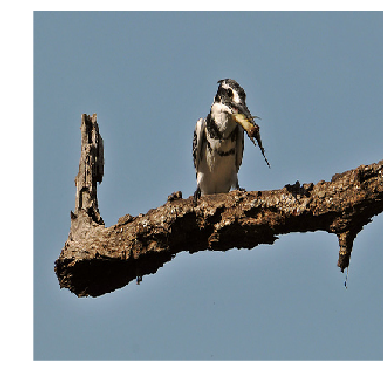

229 [ 0.00331931  0.99668068]


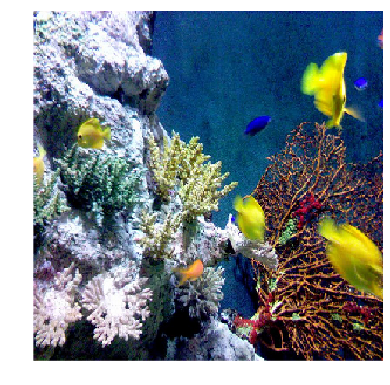

236 [ 0.01379359  0.98620647]


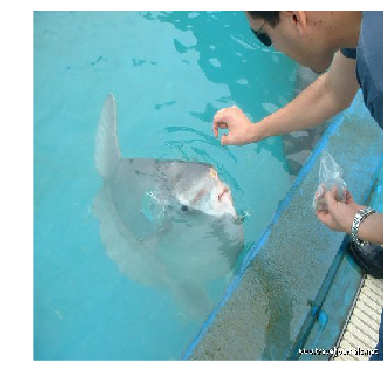

239 [ 0.18863873  0.81136125]


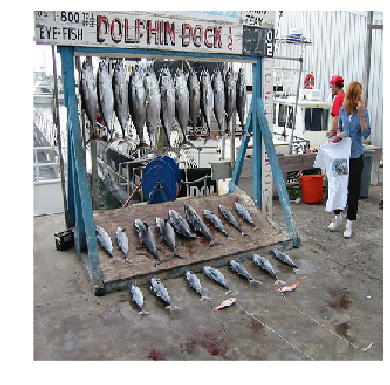

240 [ 0.2583223   0.74167764]


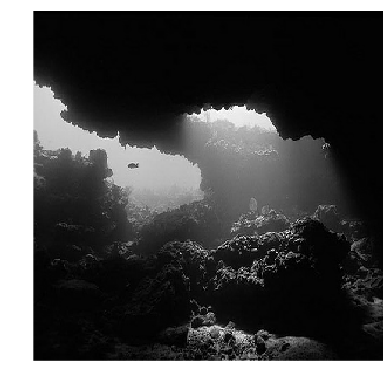

242 [ 0.00200714  0.99799287]


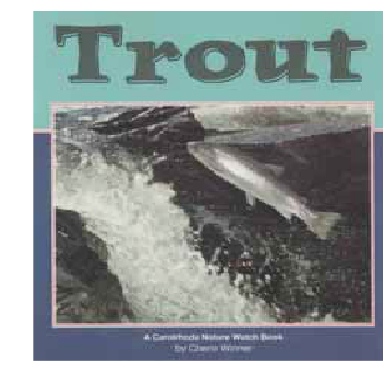

250 [ 0.00139199  0.99860805]


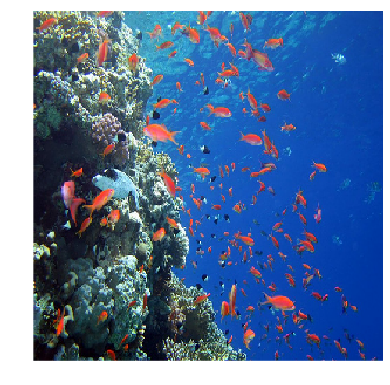

253 [ 0.00345875  0.9965412 ]


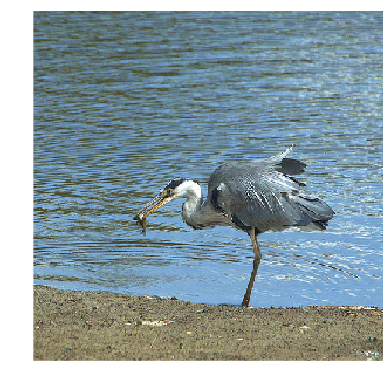

261 [ 0.05825656  0.94174343]


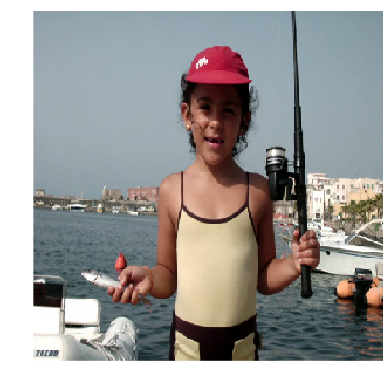

268 [ 0.00445631  0.99554366]


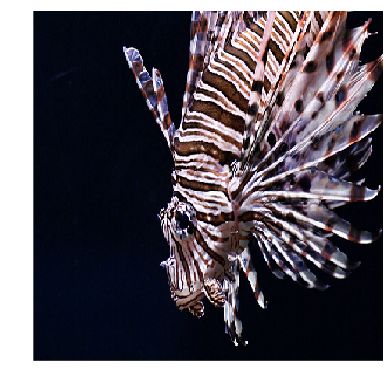

299 [ 0.02780636  0.97219366]


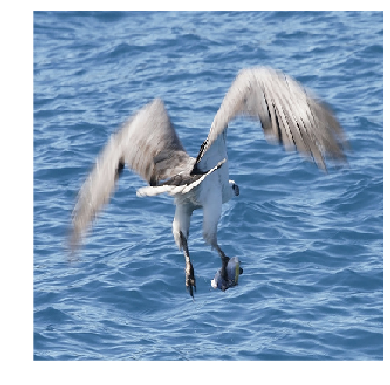

300 [ 0.88002282  0.11997721]


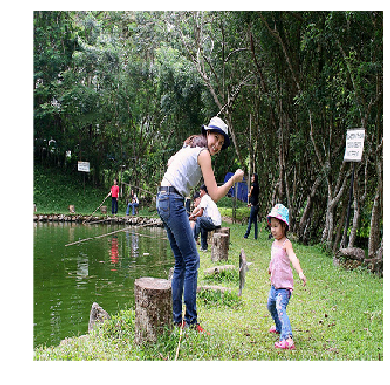

313 [ 0.00490677  0.99509323]


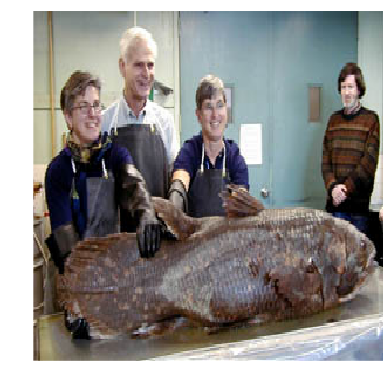

320 [ 0.06318831  0.93681169]


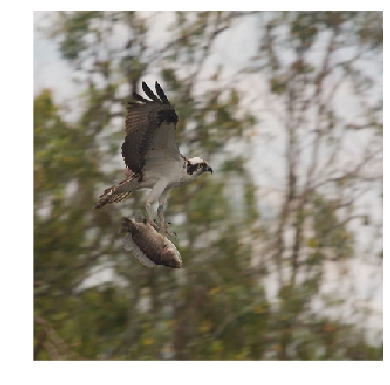

323 [ 0.00140981  0.99859017]


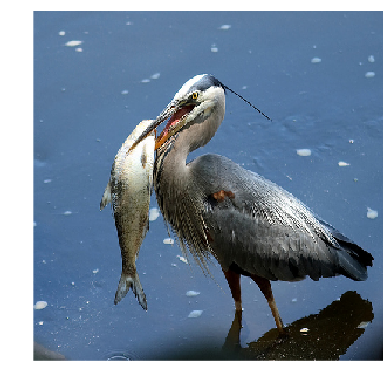

325 [ 0.00181024  0.99818975]


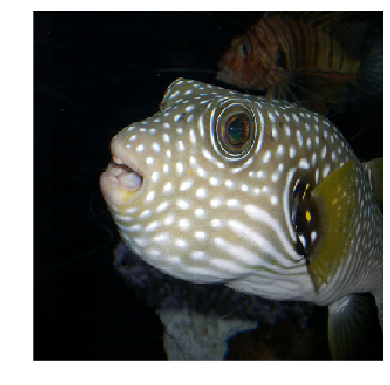

326 [ 0.00535237  0.99464756]


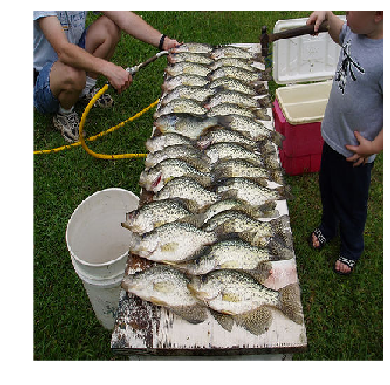

339 [ 0.73414481  0.26585522]


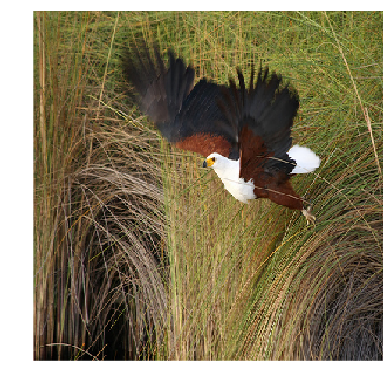

360 [ 0.00253005  0.99747002]


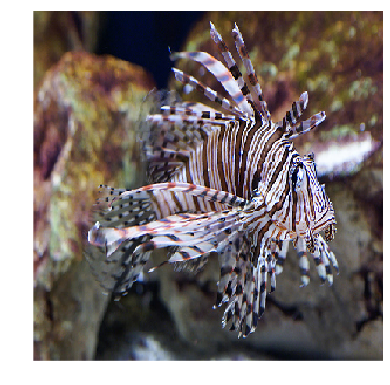

365 [ 0.30419981  0.69580019]


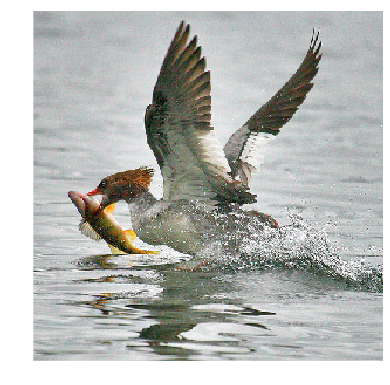

368 [ 0.36445284  0.6355471 ]


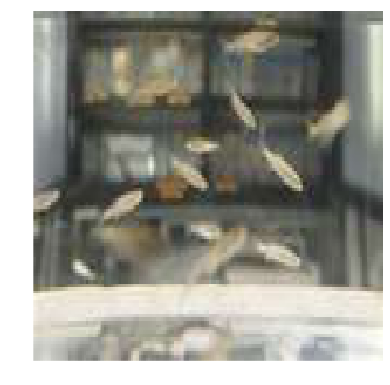

374 [ 0.00384287  0.99615711]


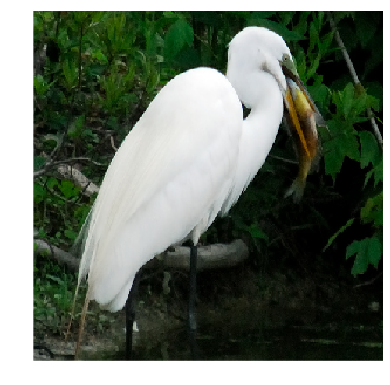

406 [ 0.02157762  0.9784224 ]


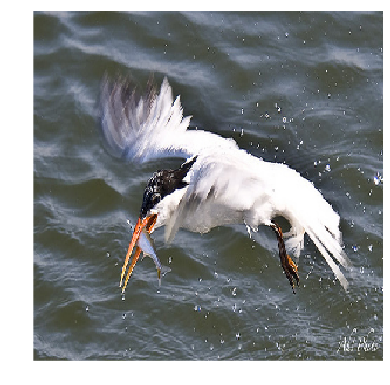

414 [ 0.15015922  0.84984076]


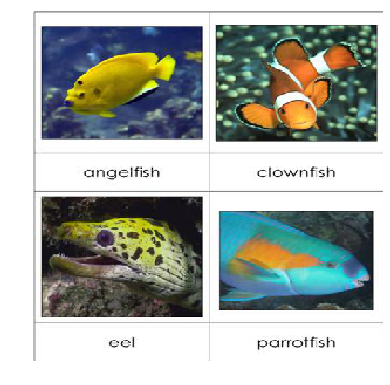

428 [ 0.6143294   0.38567057]


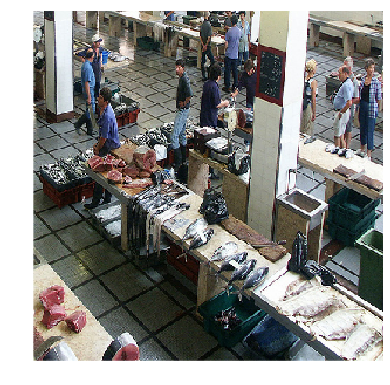

447 [ 0.00132472  0.99867529]


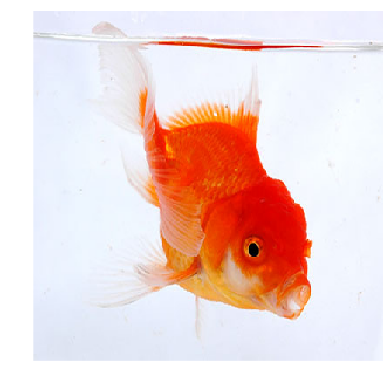

458 [ 0.37061331  0.62938666]


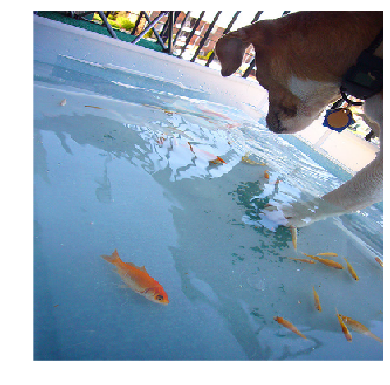

465 [ 0.00351314  0.9964869 ]


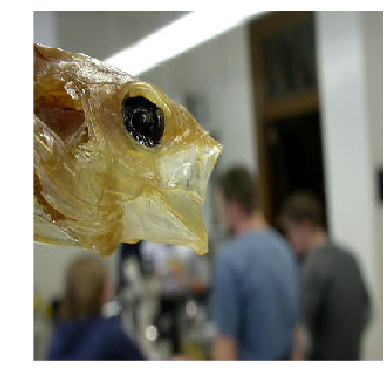

484 [ 0.86344332  0.13655673]


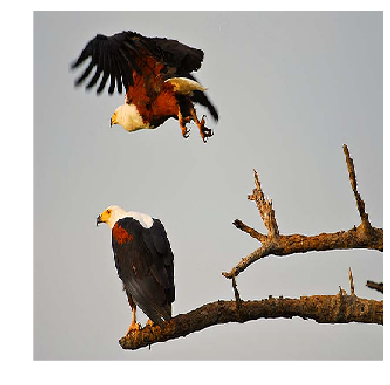

506 [ 0.00330999  0.99669003]


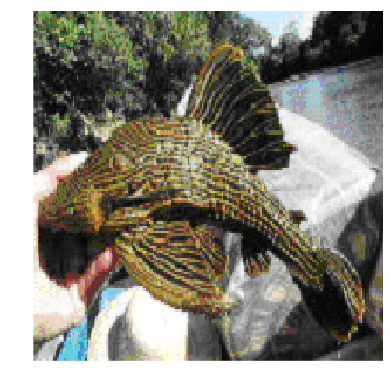

511 [ 0.0027014   0.99729866]


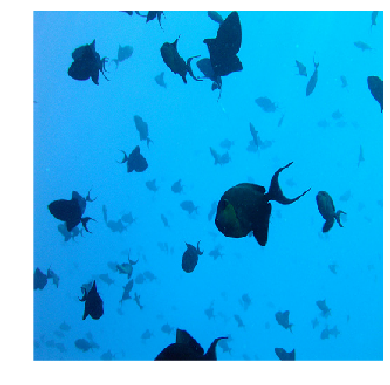

521 [ 0.00317921  0.99682081]


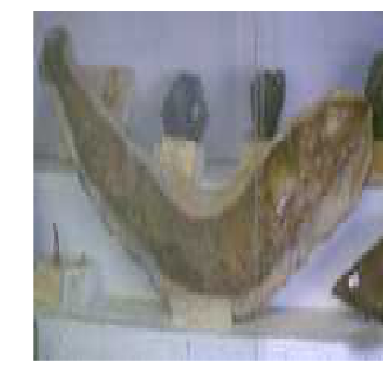

553 [ 0.00143072  0.99856925]


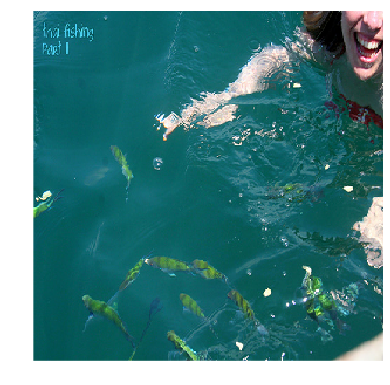

566 [ 0.00259098  0.99740905]


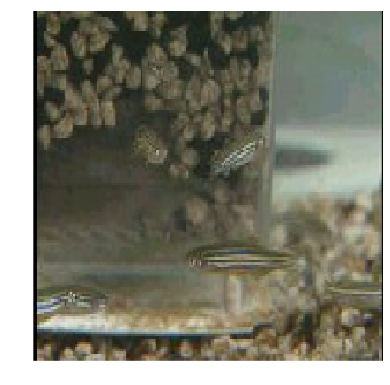

569 [ 0.01989949  0.98010051]


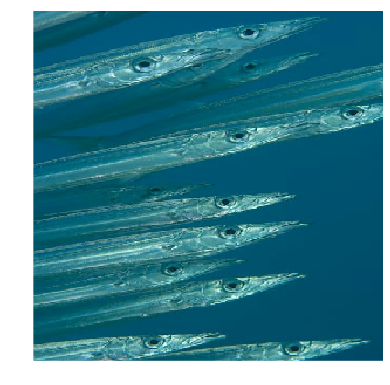

571 [ 0.00738461  0.99261546]


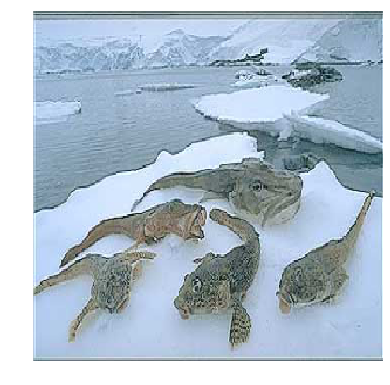

573 [ 0.0687831   0.93121696]


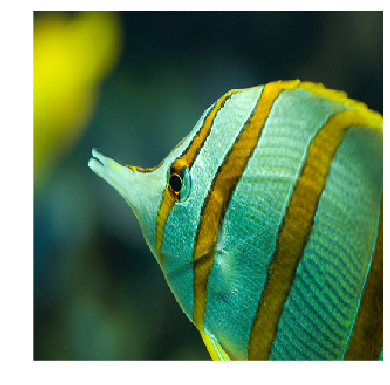

578 [ 0.00296759  0.9970324 ]


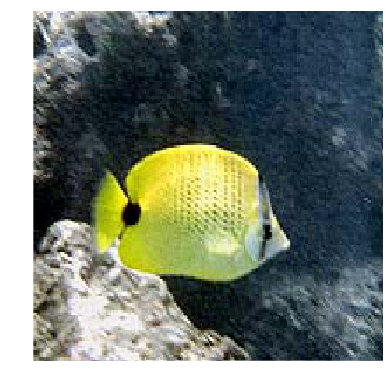

IndexError: index 600 is out of bounds for axis 0 with size 600

In [31]:
for test_idx in range(600):
    if np.max(Y_pred[test_idx,]) > 0.999: continue
    if Y_test[test_idx] == 0: continue
#     test_idx = 0
    print(test_idx, Y_pred[test_idx])
    plt.imshow((np.reshape(image_data_sets.test.x[test_idx, :], [299, 299, 3]) + 1) / 2, interpolation='none')  
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [32]:
test_indices = [35, 161, 250, 325, 447, 573, 578]

35 [ 0.00495586  0.99504411]


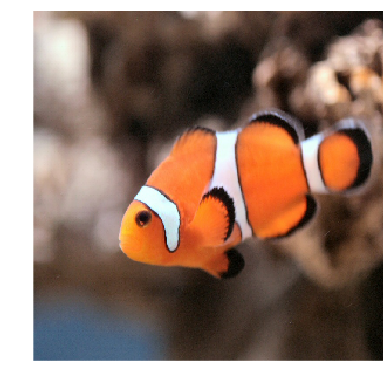

161 [ 0.00257219  0.99742776]


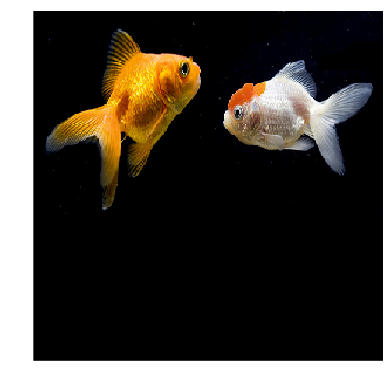

250 [ 0.00139199  0.99860805]


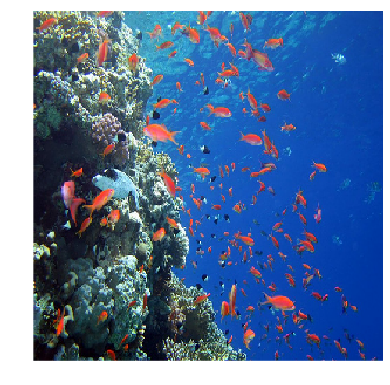

325 [ 0.00181024  0.99818975]


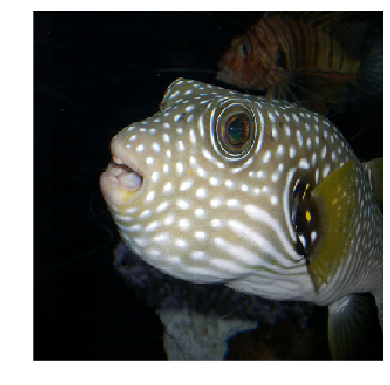

447 [ 0.00132472  0.99867529]


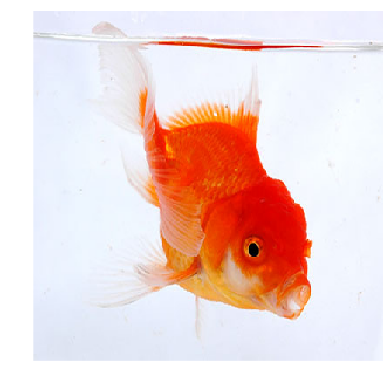

573 [ 0.0687831   0.93121696]


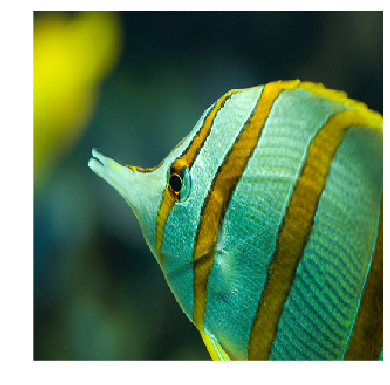

578 [ 0.00296759  0.9970324 ]


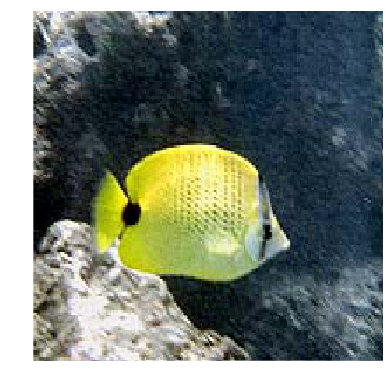

In [34]:
for test_idx in test_indices:
    print(test_idx, Y_pred[test_idx])
    plt.imshow((np.reshape(image_data_sets.test.x[test_idx, :], [299, 299, 3]) + 1) / 2, interpolation='none')  
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Attack

In [55]:
# Test indices: [35, 161, 250, 325, 447, 573, 578]
test_idx = 161
model_string = 'dogfish_%s_%s_inception' % (num_train_ex_per_class, num_test_ex_per_class)

# train_dict = np.load('/srv/scratch/pangwei/influence_data/animals_900_300_inception_inception_features_poisoned_train_influence_poison-MAI-replace-0.1_testidx_[21].npz')
train_dict = np.load(
    '/srv/scratch/pangwei/influence_data/%s_inception_features_poisoned_train_influence_poison-maxgrad-linf-replace-0.01_testidx_[%s].npz'\
    % (model_string, test_idx))
# train_dict = np.load('/srv/scratch/pangwei/influence_data/%s_features_train.npz' % model_string)
### Normal
# train_dict = np.load('data/%s_features_train.npz' % model_string)

train = DataSet(np.reshape(train_dict['inception_features_val'], [-1, 2048]), train_dict['labels'])
test_dict = np.load('/srv/scratch/pangwei/influence_data/%s_features_test.npz' % model_string)
test = DataSet(np.reshape(test_dict['inception_features_val'], [-1, 2048]), test_dict['labels'])
validation = None

data_sets = base.Datasets(train=train, validation=validation, test=test)

modify_type = 'replace'
assert(all(image_data_sets.train.labels == data_sets.train.labels))
assert(all(image_data_sets.test.labels == data_sets.test.labels))

In [56]:
input_dim = 2048
weight_decay = 0.001
batch_size = 900
initial_learning_rate = 0.001 
keep_probs = None
decay_epochs = [1000, 10000]
max_lbfgs_iter = 1000
num_classes = 2

tf.reset_default_graph()

model = BinaryLogisticRegressionWithLBFGS(
    input_dim=input_dim,
    weight_decay=weight_decay,
    max_lbfgs_iter=max_lbfgs_iter,
    num_classes=num_classes, 
    batch_size=batch_size,
    data_sets=data_sets,
    initial_learning_rate=initial_learning_rate,
    keep_probs=keep_probs,
    decay_epochs=decay_epochs,
    mini_batch=False,
    train_dir='data',
    log_dir='log',
    model_name='%s_inception_onlytop_poisoned' % model_name)

model.train()

# Y_test = model.data_sets.test.labels
attacked_Y_pred = model.sess.run(model.preds, feed_dict=model.all_test_feed_dict)

Total number of parameters: 2048
Using normal model
LBFGS training took [52] iter.
After training with LBFGS: 
Train loss (w reg) on all data: 0.00545221
Test loss (w/o reg) on all data: 0.0515062
Train acc on all data:  1.0
Test acc on all data:   0.978333333333
Norm of the mean of gradients: 9.86392e-07
Norm of the params: 2.74178


161
[ 0.00257219  0.99742776]
[ 0.92879766  0.07120229]


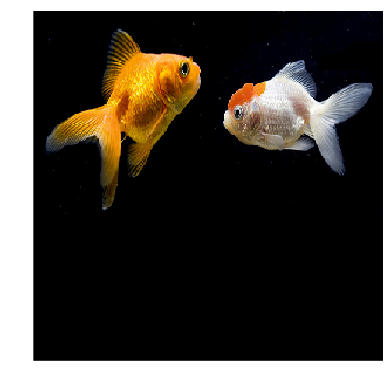

In [57]:
print(test_idx)
print(Y_pred[test_idx])
print(attacked_Y_pred[test_idx])
plt.imshow((np.reshape(image_data_sets.test.x[test_idx, :], [299, 299, 3]) + 1) / 2, interpolation='none')  
plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
Y_pred_correct = np.zeros([len(Y_test)])
for idx, label in enumerate(Y_test):
    Y_pred_correct[idx] = Y_pred[idx, int(label)]

In [50]:
poisoned_Y_pred_correct = Y_pred_correct

In [46]:
orig_Y_pred_correct = Y_pred_correct

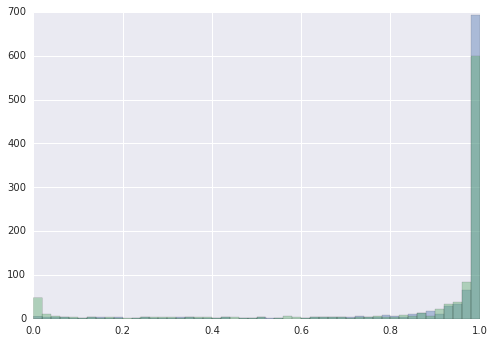

In [69]:
sns.distplot(orig_Y_pred_correct, kde=False)
sns.distplot(poisoned_Y_pred_correct, kde=False)


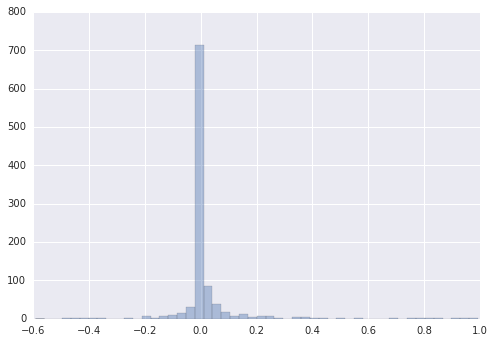

In [68]:
sns.distplot(orig_Y_pred_correct - Y_pred_correct, kde=False)

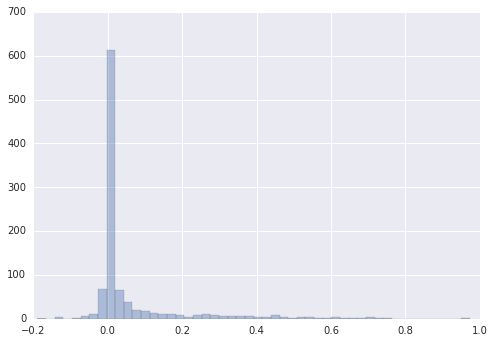

In [64]:
sns.distplot(orig_Y_pred_correct - poisoned_Y_pred_correct, kde=False)

True: 0.0
Predicted: [  1.48447621e-09   3.59972619e-05   1.84162855e-04   9.94826734e-01
   2.60378001e-03   1.22097656e-04   3.62382380e-05   1.70509284e-05
   1.00722882e-05   2.16390658e-03]


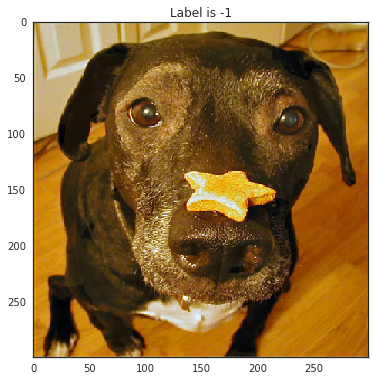

In [65]:
print('True: %s' % Y_test[test_idx])
print('Predicted: %s' % Y_pred[test_idx])

test_image = reverse_preprocess(np.copy(image_data_sets.test.x[test_idx, :]))
test_label = image_data_sets.test.labels[test_idx]
plot_flat_colorimage(test_image, test_label, side=299)

# Pictures of animals and their predictions (without poisoning)

True: 0.0
Predicted: [  9.93492901e-01   7.68667014e-05   5.92689728e-04   3.35619436e-03
   7.16991839e-04   3.13720084e-04   2.36264925e-04   8.47417905e-05
   2.30153655e-05   1.10662507e-03]


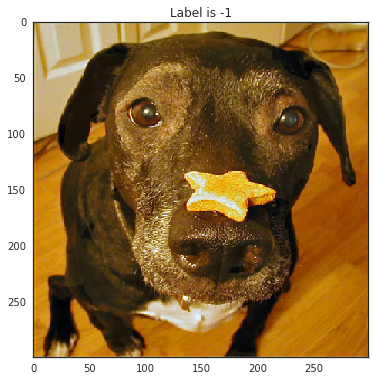

In [61]:
test_idx = 1
print('True: %s' % Y_test[test_idx])
print('Predicted: %s' % Y_pred[test_idx, :])

test_image = reverse_preprocess(np.copy(image_data_sets.test.x[test_idx, :]))
test_label = image_data_sets.test.labels[test_idx]
plot_flat_colorimage(test_image, test_label, side=299)

True: 1.0
Predicted: 0.999451
Log loss: 0.000549049874037


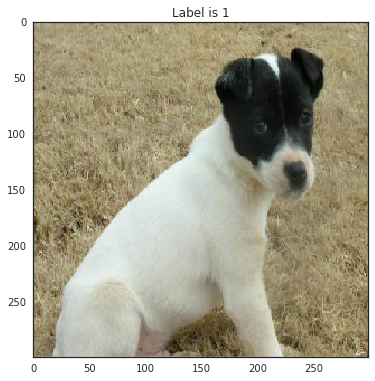

In [237]:
test_idx = 15
print('True: %s' % Y_test[test_idx])
print('Predicted: %s' % Y_pred[test_idx])
log_loss = -np.log(Y_test[test_idx] * Y_pred[test_idx] + (1 - Y_test[test_idx]) * (1 - Y_pred[test_idx]))
print('Log loss: %s' % log_loss)

test_image = reverse_preprocess(np.copy(image_data_sets.test.x[test_idx, :]))
test_label = image_data_sets.test.labels[test_idx]
plot_flat_colorimage(test_image, test_label, side=299)

True: 1.0
Predicted: 0.888253
Log loss: 0.118498696429


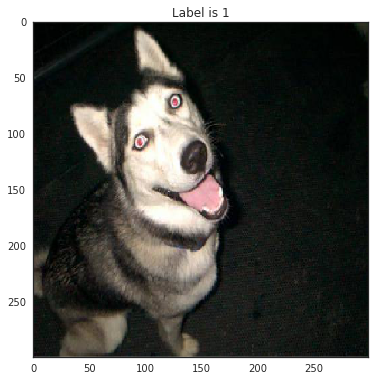

In [241]:
test_idx = 33
print('True: %s' % Y_test[test_idx])
print('Predicted: %s' % Y_pred[test_idx])
log_loss = -np.log(Y_test[test_idx] * Y_pred[test_idx] + (1 - Y_test[test_idx]) * (1 - Y_pred[test_idx]))
print('Log loss: %s' % log_loss)

test_image = reverse_preprocess(np.copy(image_data_sets.test.x[test_idx, :]))
test_label = image_data_sets.test.labels[test_idx]
plot_flat_colorimage(test_image, test_label, side=299)

825
True: 0.0
Predicted: 0.0414969
Log loss: 0.0423824617834


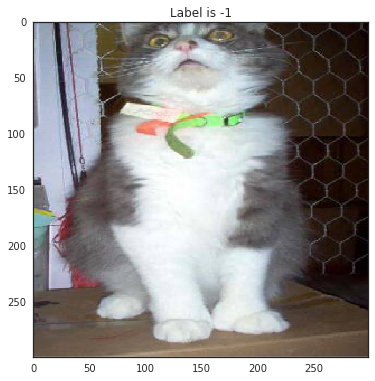

In [242]:
sort_idx = 484
np.sort(Y_pred)[sort_idx]
test_idx = np.argsort(Y_pred)[sort_idx]
print(test_idx)
print('True: %s' % Y_test[test_idx])
print('Predicted: %s' % Y_pred[test_idx])
log_loss = -np.log(Y_test[test_idx] * Y_pred[test_idx] + (1 - Y_test[test_idx]) * (1 - Y_pred[test_idx]))
print('Log loss: %s' % log_loss)

test_image = reverse_preprocess(np.copy(image_data_sets.test.x[test_idx, :]))
test_label = image_data_sets.test.labels[test_idx]
plot_flat_colorimage(test_image, test_label, side=299)

True: 0.0
Predicted: 0.000371538


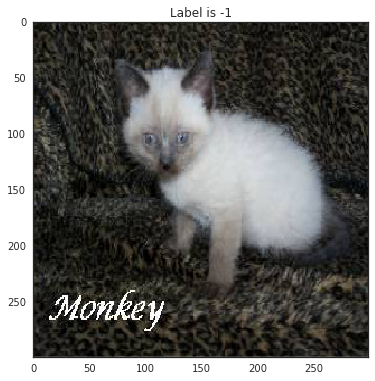

In [73]:
test_idx = 45
print('True: %s' % Y_test[test_idx])
print('Predicted: %s' % Y_pred[test_idx])

test_image = reverse_preprocess(np.copy(image_data_sets.test.x[test_idx, :]))
test_label = image_data_sets.test.labels[test_idx]
plot_flat_colorimage(test_image, test_label, side=299)

# How different are the poisoned examples vs. normal variation?

In [78]:
np.min(image_data_sets.train.x)

-1.0

In [79]:
centers

array([[-0.15708911, -0.14228433,  0.01859124, ...,  0.14652792,
        -0.08452277,  0.00155818],
       [-0.10103229, -0.01307835, -0.14758964, ..., -0.05739734,
        -0.01313132,  0.04331716]])

In [80]:
label_indices

array([False, False, False, False,  True,  True,  True,  True,  True,
        True, False, False,  True,  True,  True,  True, False,  True,
       False, False, False, False,  True, False, False, False, False,
        True,  True, False, False, False,  True, False,  True, False,
       False,  True, False,  True, False, False,  True, False,  True,
       False, False, False,  True, False,  True,  True, False,  True,
        True,  True,  True,  True, False,  True,  True,  True, False,
       False,  True,  True, False, False,  True,  True, False, False,
        True,  True,  True,  True, False, False, False,  True, False,
        True,  True, False,  True,  True,  True, False,  True,  True,
        True, False, False,  True, False, False, False, False, False, False], dtype=bool)

In [81]:
distances.shape

(1000, 268203)

In [16]:
# Compute average l2 distance of each training example to their 
# cluster center
dim = image_data_sets.train.x.shape[1]
centers = np.zeros([2, dim])
avg_dist = np.zeros([2])
for label in [0, 1]:
    label_indices = (image_data_sets.train.labels == label)
    centers[label, :] = np.mean(image_data_sets.train.x[label_indices, :], axis=0)
    dists = image_data_sets.train.x[label_indices, :] - centers[label]
    avg_dist[label] = np.mean(np.linalg.norm(dists, axis=1))

avg_dist

array([ 263.68387306,  257.04856512])

In [17]:
# Compute l2 distance of a perturbed example to the original example
# Each pixel is modified by (2.0 / 255)
perturbed_distance = np.sqrt(dim * 2.0 / 255)
perturbed_distance

45.864506333072754

array([ 19.92613171,  22.4012713 ])

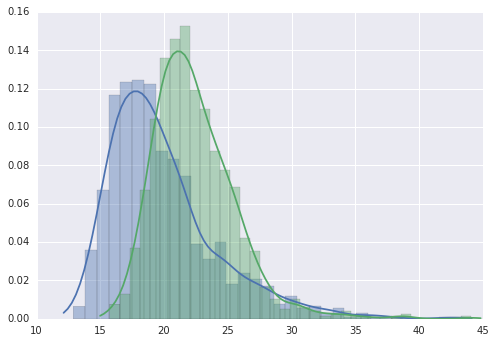

In [82]:
### Feature space
normal_train_dict = np.load('data/%s_features_train.npz' % model_string)
X = normal_train_dict['inception_features_val']
Y = normal_train_dict['labels']

dim = X.shape[1]
centers = np.zeros([2, dim])
avg_dist = np.zeros([2])
for label in [0, 1]:
    label_indices = (Y == label)
    centers[label, :] = np.mean(X[label_indices, :], axis=0)
    dists = X[label_indices, :] - centers[label]
    norms = np.linalg.norm(dists, axis=1)
    avg_dist[label] = np.mean(np.linalg.norm(dists, axis=1))
    sns.distplot(norms)

avg_dist

In [83]:
normal_train_dict = np.load('data/%s_features_train.npz' % model_string)
X = normal_train_dict['inception_features_val']
Y = normal_train_dict['labels']

poisoned_train_dict = np.load('data/normal_dog_2000_1000_inception_inception_features_poisoned_train_influence_poison-maxgrad-linf-replace-0.05_testidx_825.npz')
X_poison = poisoned_train_dict['inception_features_val']
Y_poison = poisoned_train_dict['labels']

In [84]:
assert all(Y == Y_poison)
modified_idx = np.where(~np.all(X == X_poison, axis=1))[0]
dists = X_poison[modified_idx, :] - X[modified_idx, :]
np.mean(np.linalg.norm(dists, axis=1))


23.580151

array([ 31.01453623,  29.19473356])

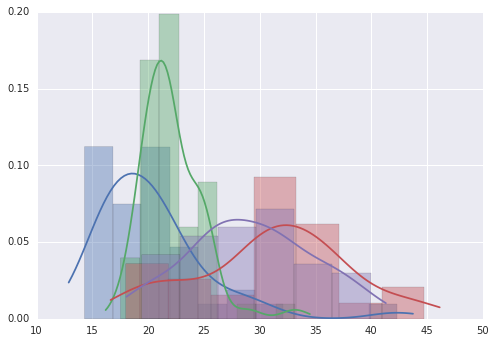

In [85]:
for label in [0, 1]:
    label_indices = (Y_poison == label)
    centers[label, :] = np.mean(X_poison[label_indices, :], axis=0)        
    dists = X_poison[label_indices, :] - centers[label]
    norms = np.linalg.norm(dists, axis=1)
    avg_dist[label] = np.mean(np.linalg.norm(dists, axis=1))

X_unmodified = X_poison[~modified_idx, :]
Y_unmodified = Y_poison[~modified_idx]
for label in [0, 1]:
    label_indices = (Y_unmodified == label)
    dists = X_unmodified[label_indices, :] - centers[label]
    avg_dist[label] = np.mean(np.linalg.norm(dists, axis=1))
    norms = np.linalg.norm(dists, axis=1)
    sns.distplot(norms)

X_modified = X_poison[modified_idx, :]
Y_modified = Y_poison[modified_idx]
for label in [0, 1]:
    label_indices = (Y_modified == label)
    dists = X_modified[label_indices, :] - centers[label]
    avg_dist[label] = np.mean(np.linalg.norm(dists, axis=1))
    norms = np.linalg.norm(dists, axis=1)
    sns.distplot(norms)
avg_dist

In [87]:
np.linalg.norm(centers[0, :] - centers[1, :])

20.578502823118829

# Visualize poisoned training examples

In [13]:
f = np.load('data/skewed_dog_inception_poisoned_data_sets_testidx_403.npy')

In [19]:
poisoned_train = f[0]
validation = f[1]
test = f[2]
poisoned_data_sets = poisoned_data_sets = base.Datasets(train=poisoned_train, validation=validation, test=test)

assert np.all(poisoned_data_sets.test.x == image_data_sets.test.x)
assert all(poisoned_data_sets.test.labels == image_data_sets.test.labels)
assert all(poisoned_data_sets.train.labels == image_data_sets.train.labels)
assert (np.max(np.abs(poisoned_data_sets.train.x - image_data_sets.train.x)) * 255 / 2) <= 1.0001


In [18]:
np.min(poisoned_data_sets.train.x)

-1.0

In [16]:

# Make sure that the poisoned data sets are at most 1 different from the orig data sets in each pixel
np.max(np.abs(poisoned_data_sets.train.x - image_data_sets.train.x)) * 255 / 2

2.0000074803829193

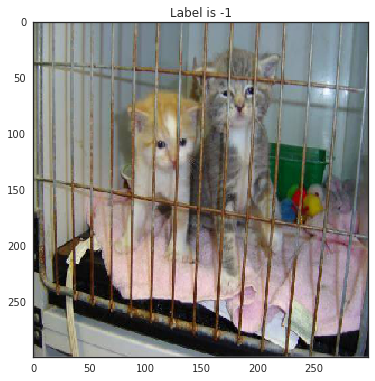

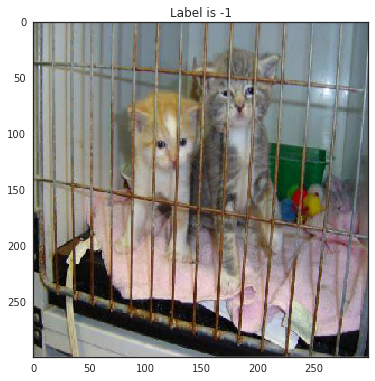

In [24]:
train_idx = 1225

orig_train_image = reverse_preprocess(np.copy(image_data_sets.train.x[train_idx, :]))
orig_train_label = image_data_sets.train.labels[train_idx]
plot_flat_colorimage(orig_train_image, orig_train_label, side=299)

poisoned_train_image = reverse_preprocess(np.copy(poisoned_data_sets.train.x[train_idx, :]))
poisoned_train_label = poisoned_data_sets.train.labels[train_idx]
plot_flat_colorimage(poisoned_train_image, poisoned_train_label, side=299)

In [34]:
diff = poisoned_train_image - orig_train_image

diff < 0

array([ True,  True,  True, ..., False,  True,  True], dtype=bool)

In [36]:
diff

array([ 0.00392157,  0.00392157,  0.00392157, ...,  0.        ,
        0.00392157,  0.00392157], dtype=float32)

In [39]:
poisoned_train_image.shape

(268203,)

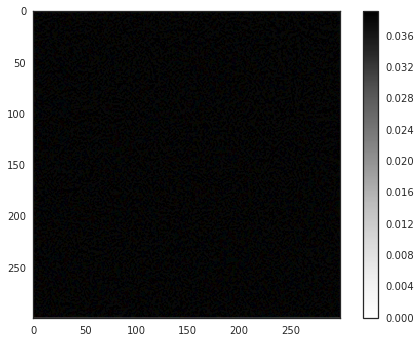

In [54]:
diff = poisoned_train_image - orig_train_image
diff[diff < 0] = 0
reshaped_diff = np.reshape(diff, [299, 299, 3])
# print(reshaped_diff[:10, :10, :])
plot_flat_colorgrad(diff * 10, side=299)

## The change in model behavior could be because of a change in the logistic regression weights, or a change in the Inception features generated.

Seems like both change...?

## How different are the learned weights?

In [88]:
# Train normal model
train_dict = np.load('data/skewed_dog_inception_morereg_inception_features_train.npz')
train = DataSet(np.reshape(train_dict['inception_features_val'], [-1, 2048]), train_dict['labels'])
test_dict = np.load('data/skewed_dog_inception_morereg_inception_features_test.npz')
test = DataSet(np.reshape(test_dict['inception_features_val'], [-1, 2048]), test_dict['labels'])
validation = None
data_sets = base.Datasets(train=train, validation=validation, test=test)
assert(all(image_data_sets.train.labels == data_sets.train.labels))
assert(all(image_data_sets.test.labels == data_sets.test.labels))

tf.reset_default_graph()

model = BinaryLogisticRegressionWithLBFGS(
    input_dim=input_dim,
    weight_decay=weight_decay,
    max_lbfgs_iter=max_lbfgs_iter,
    num_classes=num_classes, 
    batch_size=batch_size,
    data_sets=data_sets,
    initial_learning_rate=initial_learning_rate,
    keep_probs=keep_probs,
    decay_epochs=decay_epochs,
    mini_batch=False,
    train_dir='data',
    log_dir='log',
    model_name='skewed_dog_inception_onlytop_poisoned')

model.train()
normal_weights = model.sess.run(model.params)[0]

# Train poisoned model
test_idx = 403

train_dict = np.load('data/skewed_dog_inception_inception_features_poisoned_train_influence_testidx_%s.npz' % test_idx) 
train = DataSet(np.reshape(train_dict['inception_features_val'], [-1, 2048]), train_dict['labels'])
test_dict = np.load('data/skewed_dog_inception_morereg_inception_features_test.npz')
test = DataSet(np.reshape(test_dict['inception_features_val'], [-1, 2048]), test_dict['labels'])
validation = None
data_sets = base.Datasets(train=train, validation=validation, test=test)
assert(all(image_data_sets.train.labels == data_sets.train.labels))
assert(all(image_data_sets.test.labels == data_sets.test.labels))
tf.reset_default_graph()

model = BinaryLogisticRegressionWithLBFGS(
    input_dim=input_dim,
    weight_decay=weight_decay,
    max_lbfgs_iter=max_lbfgs_iter,
    num_classes=num_classes, 
    batch_size=batch_size,
    data_sets=data_sets,
    initial_learning_rate=initial_learning_rate,
    keep_probs=keep_probs,
    decay_epochs=decay_epochs,
    mini_batch=False,
    train_dir='data',
    log_dir='log',
    model_name='skewed_dog_inception_onlytop_poisoned')

model.train()
poisoned_weights = model.sess.run(model.params)[0]

Total number of parameters: 2048
Using normal model
LBFGS training took [30] iter.
After training with LBFGS: 
Train loss on all data: 0.0123257
Train acc on all data:  1.0
Test acc on all data:   0.982857142857
Norm of the mean of gradients: 1.30656e-06
Norm of the params: 1.23108
Total number of parameters: 2048
Using normal model
LBFGS training took [34] iter.
After training with LBFGS: 
Train loss on all data: 0.014132
Train acc on all data:  1.0
Test acc on all data:   0.778571428571
Norm of the mean of gradients: 1.07193e-06
Norm of the params: 1.34328


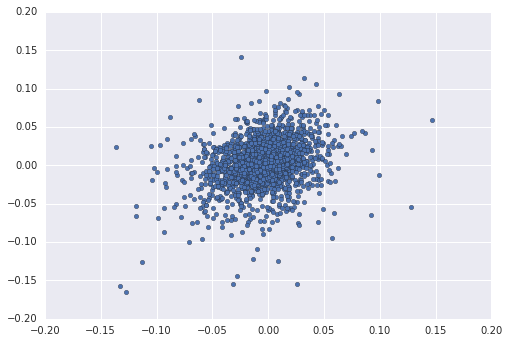

In [89]:
plt.scatter(normal_weights, poisoned_weights)

In [90]:
poisoned_weights.shape

(2048,)

## How different are the Inception features?

In [79]:
# Normal
normal_train_dict = np.load('data/skewed_dog_inception_morereg_inception_features_train.npz')

# Poisoned
test_idx = 10
poisoned_train_dict = np.load('data/skewed_dog_inception_inception_features_poisoned_train_influence_testidx_%s.npz' % test_idx) 
# poisoned_train_dict = np.load('data/skewed_dog_inception_inception_features_poisoned_train_random_testidx_None.npz')
# poisoned_train_dict = np.load('data/skewed_dog_inception_inception_features_poisoned_train_traingrad_testidx_None.npz')
# poisoned_train_dict = np.load('data/skewed_dog_inception_inception_features_poisoned_train_mirror_testidx_%s.npz' % test_idx)

# poisoned_train_dict = np.load('data/skewed_dog_inception_inception_features_poisoned_train_testidx_None.npz')

X_train_normal = normal_train_dict['inception_features_val']
X_train_poisoned = poisoned_train_dict['inception_features_val']

Y_train_normal = normal_train_dict['labels']
Y_train_poisoned = poisoned_train_dict['labels']
assert(all(Y_train_normal == Y_train_poisoned))
# np.reshape(train_dict['inception_features_val'], [-1, 2048]

In [80]:
diff = X_train_normal - X_train_poisoned
diff_norm = np.linalg.norm(diff, axis=1)
normal_norm = np.linalg.norm(X_train_normal, axis=1)
poisoned_norm = np.linalg.norm(X_train_poisoned, axis=1)

(15, 55)

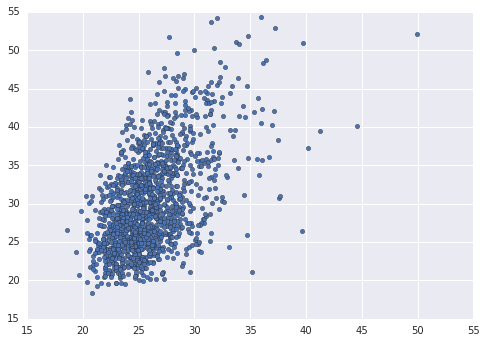

In [87]:
plt.scatter(normal_norm, poisoned_norm)
plt.xlim(15, 55)
plt.ylim(15, 55)

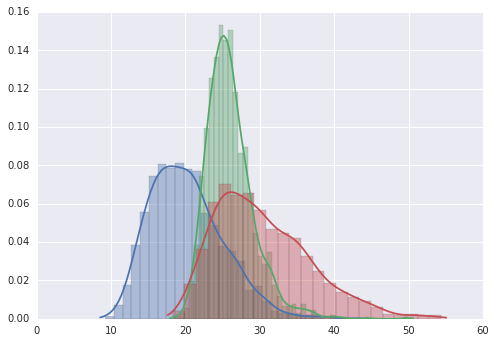

In [82]:
sns.distplot(diff_norm)
sns.distplot(normal_norm)
sns.distplot(poisoned_norm)

# Blue: Differences
# Green: Original
# Red: Poisoned